<a href="https://colab.research.google.com/github/curieuxjy/deep-learning-from-scratch-5/blob/main/ch9_diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#CHAPTER 9 확산 모델 구현

# Step 9: Diffusion Model

8장 : 확산 모델의 이론

9장 : 확산 모델 구현
- 확산 모델 신경 : U-Net 모델을 많이 사용
- 시각 데이터(정수 데이터)를 효율적으로 처리하기 위한 사인파 위치 인코딩
- 가우스 노이즈를 추가하는 확산 과정 하나씩 확인하면서 구현
- MNIST 데이터셋을 이용한 확산 모델 학습

##9.1 U-Net

노이즈 예측

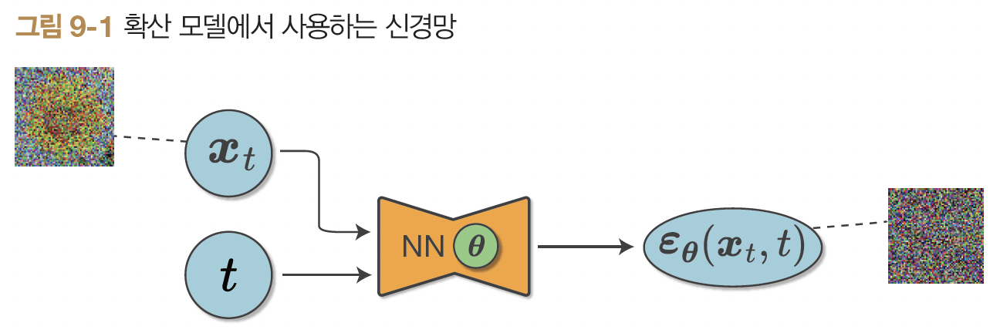

우선 t를 생략한 형태로 구현
- 간소한 형태로 구현 후 t 추가

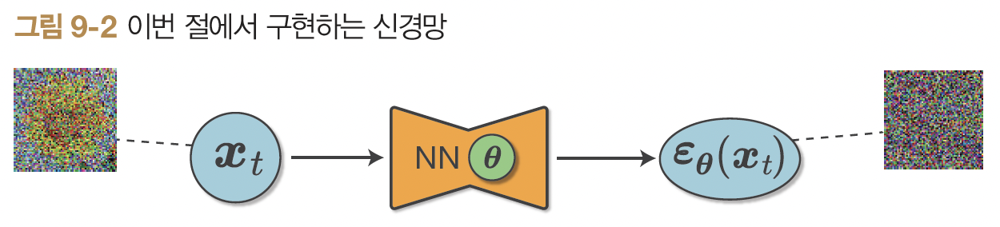

[그림 9-2]의 신경망은 $\varepsilon_{\theta}(x_t)$로 표현
- 입력과 출력의 형상이 같다.
- AutoEncoder, FCN, U-Net

###9.1.1 U-Net이란?

U-Net은 원래 의료 이미지의 시멘틱 분할용으로 개발된 모델
- 시메틱(semantic segmentation)이란 의미를 기준 분할한다.
  - [그림 9-3] - 이미지 각픽셀에 특정한 클래스 레이블 할당

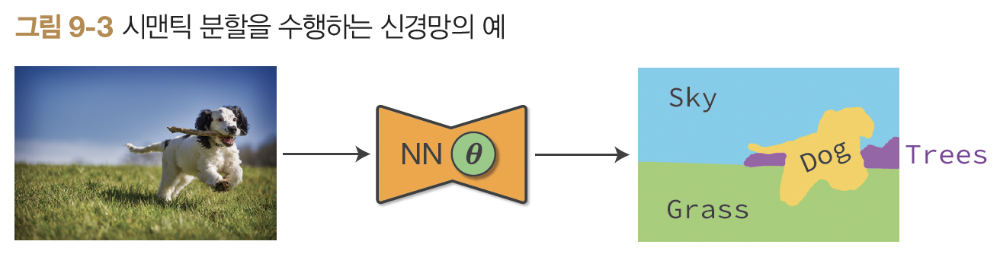

U-Net 입력 : (C, H, W) 형상의 이미지 데이터
- C : 입력 이미지의 채널 수(칼러 3, 흑백 1)
- H와 W는 이미지의 높이와 너비

출력 : (D, H, W) 형상 텐서
- D : 분할할 클래스의 개수
  - 이 신경망은 각 픽셀이 D개의 클래스 중 어디에 속할지 예측하는 확률 분포를 출력
  - 확산 모델에서는 입출력 채널 수를 동일한 C로 설정
  - 출력도 (C, H, W)로 설정

U-Net의 신경망 구조 표현
- U-Net이라는 이름은 신경망 구조가 알파벳 U를 닮았다는 데서 유래함

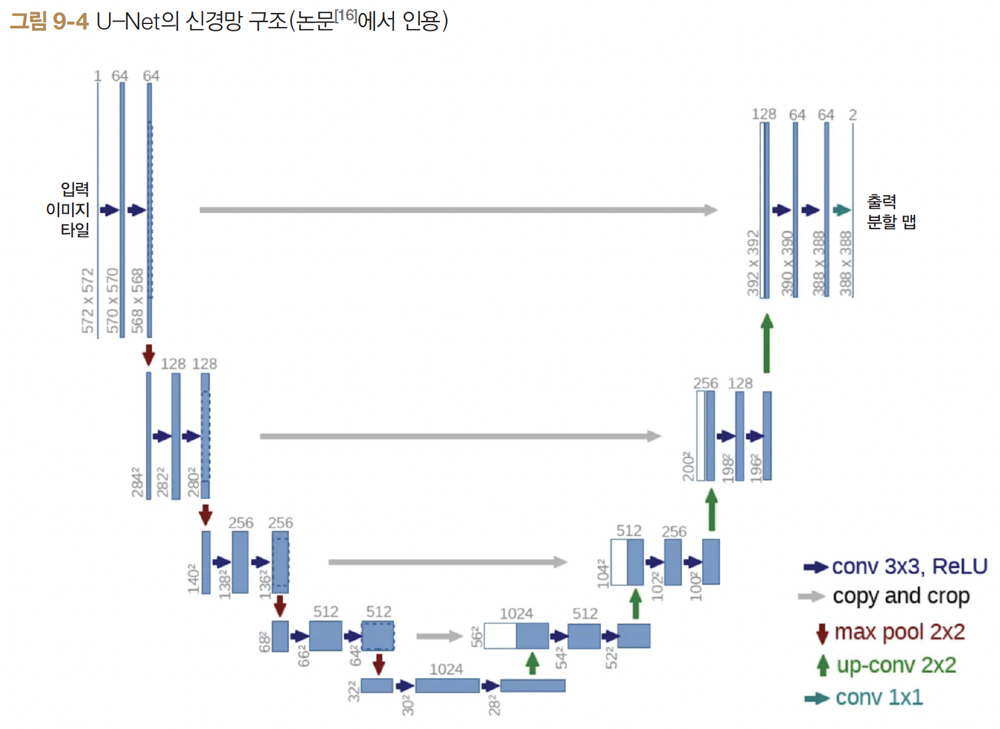

유닛 처리는 축소 단계와 확대 단계로 나뉩니다. 축소 단계에서 합성도 계층을 통해 특징 맵을 전진적으로 줄입니다.

축소 단계에서 합성곱 계층을 통과시키며 특성맵(feature map)을 점진적으로 축소시킵니다.

특성 맵을 작게 만드는 층을 다운샘플링 계층(downsamoling layer)이라고 합니다

반면 확대 단계에서는 합성곱 계층을 통해 특성을 추출하면서, 전반부와 반대로 특성맵을 특성맵의 글자를 점진적으로 키웁니다. 특성 맵을 크게 만드는 계층을 업샘플링 계층이라고 합니다.

U-net은 스킵 연결로 유명합니다.
- 스킵 연결 : 대응하는 축소 단계와 확대 단계 사이에서 특정 맵을 직접 전달하는 메카니즘
- 스킵 연결을 통해 U-Net은 물체 전체의 특징을 파악하면서 보다 세밀한 공간적 위치 정보를 이용할 수 있습니다.


###9.1.2 U-Net 구현

  1 x 28 x 28의 크기의 MNIST를 처리하는 간단한 U-Net을 구현합니다.
  - 신경만 구조는 [그림 9-5]와 같습니다

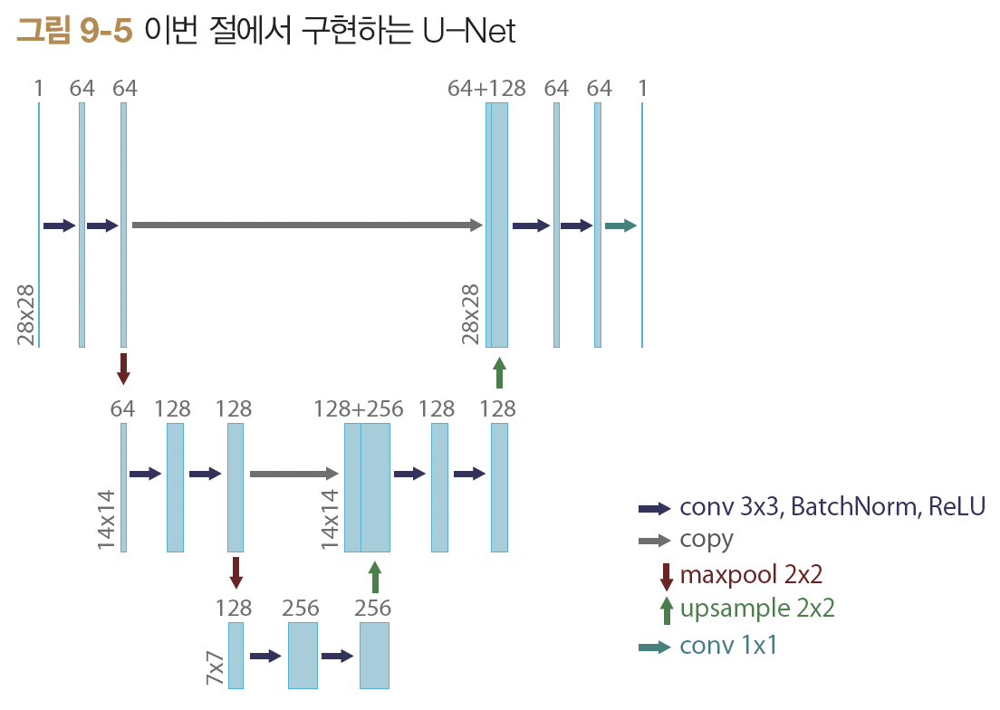

그림에서 보듯 축소 단계와 확대 단계를 두 번씩 거칩니다.

각 단계는 2층의 합성곱 계층으로 처리합니다.
이 U-Net을 구현하기 위해 먼저 합성곱 블록을 표현하는 ConvBlock 클래스를 구현하겠습니다

ConvBlock 클래스는 [그림 9-6]과 같이 합성곱 계층, 배치 정규화 계층, ReLU 함수를 각각 두 번씩 처리합니다.


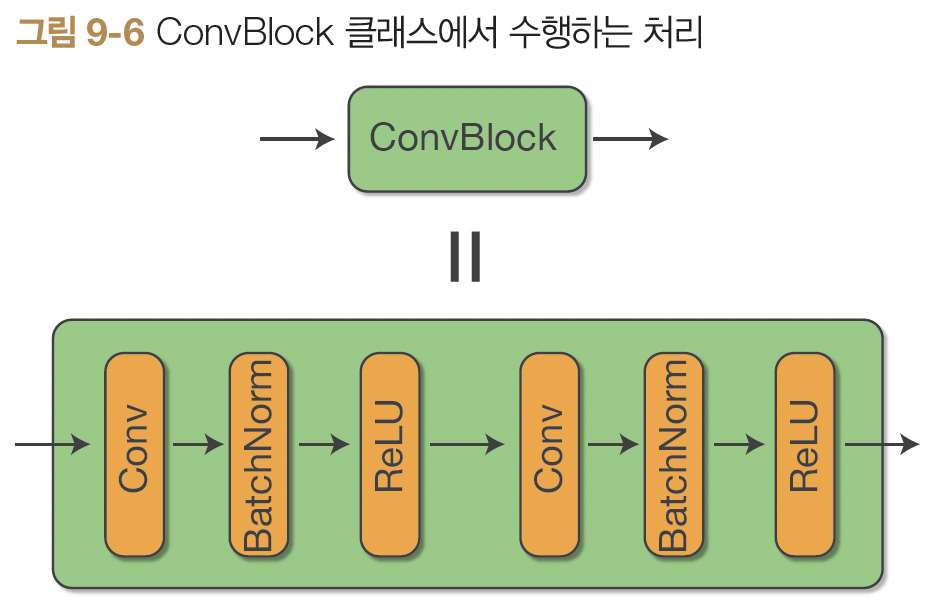

- simple_unet.py

In [1]:
import torch
from torch import nn


class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.convs = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU()
        )

    def forward(self, x):
        return self.convs(x)


 nn.Sequential()을 이용하여 여러 계층을 직렬로 연결하여 데이터가 각 계층을 차례로 통과하도록 구현합니다.

 이 ConvBlock 클래스를 사용하여 [그림 9-5]를 표현하는 UNet 클래스를 구현해 봅시다

In [2]:
class UNet(nn.Module):
    def __init__(self, in_ch=1):
        super().__init__()

        self.down1 = ConvBlock(in_ch, 64)
        self.down2 = ConvBlock(64, 128)
        self.bot1 = ConvBlock(128, 256)
        self.up2 = ConvBlock(128 + 256, 128)
        self.up1 = ConvBlock(128 + 64, 64)
        self.out = nn.Conv2d(64, in_ch, 1)

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')

    def forward(self, x):
        x1 = self.down1(x)
        x = self.maxpool(x1)
        x2 = self.down2(x)
        x = self.maxpool(x2)

        x = self.bot1(x)

        x = self.upsample(x)
        x = torch.cat([x, x2], dim=1)
        x = self.up2(x)
        x = self.upsample(x)
        x = torch.cat([x, x1], dim=1)
        x = self.up1(x)
        x = self.out(x)
        return x

이번 구현에서는 맥스 풀링(max pooling)을 사용하여 크기를 줄였습니다.

이렇게 하면 텐서의 크기가 1/2로 줄어듭니다.

한편 확대 처리에는 쌍선형 보관법으로 업샘플링을 하여 크기를 두 배로 키웠습니다


U-Net의 스킵 연결은 torch.cat([x, x1], dim=1) 코드로 구현합니다.

torch.cat()은 텐서를 결합하는 함수이며 인수 dim=1로 결합할 차원을 지정합니다.

x의  형상이 (N, C, H, W)이고 x1의 형상이 (N, I, H, W)라면 결합 후에 텐서의 형상은 (N, C + I, H, W)가 됩니다.



In [3]:
model = UNet()
x = torch.randn(10, 1, 28, 28)  # dummy input
y = model(x)
print(y.shape)

torch.Size([10, 1, 28, 28])


##9.2 사인파 위치 인코딩

앞 절에서는 $x_t$만을 처리하는 U-Net을 구현했습니다.

남은 과제는 시각 $t$를 U-Net에 도입하는 것입니다.

여기에선 $t$는 정수라는 점을 주목합시다.

신경망에서는 정수를 벡터로 변환하여 학습과 예측을 더 효과적으로 수행합니다.

확산 모델에서는 시각 $t$를 인코딩 할 때 종종 사인파 위치인 코딩을 사용합니다


###9.2.1 사인파 위치 인코딩이란?

사인파 위치 인코딩은 Attention is All You Need 논문의 트랜스포머에서(transformer)에서 사용해서 유명해졌습니다.

사인파 위치 인코딩
-  사인파를 이용해 위치 정보를 인코딩 한다는 뜻입니다.

위치 정보란 시계열 데이터에서 각 원소에 출현 위치를 말합니다.

자연어 처리해서라면 단어의 출력 위치가 위치 정보에 해당합니다.

확산 모델에서의 시각 $t$도 위치 정보입니다



사인파 위치 인코딩은 정수 $t$를 벡터 $v$로 변환합니다.

변환된 벡터 $v$의 차원 수를 $D$라고 하면 벡터 $i$ 번째 원소는 다음 식으로 표현합니다.


$$v_i=
\begin{cases}
sin \Big(\frac{t}{10000 \frac{1}{D}}\Big) \qquad (i가 \;짝수일 \; 때)\\
cos \Big(\frac{t}{10000 \frac{1}{D}}\Big) \qquad (i가 \; 홀수일 \; 때)
\end{cases}$$

사인파 위치 인코딩은 위치 정보를 주기적으로 주기적인 특성을 지닌 sin 함수와 cos 함수를 이용해 인코딩 합니다.

이렇게 해서 위치 정보에 상대적 위치와 상대적 차이와 주기적 패턴을 명확하게 표현할 수 있습니다.

따라서 신경망 모델이 시계열 데이터에 담겨 있는 데이터의 상대적 위치를 더 효과적으로 학습할 수 있습니다.

###9.2.2 사인파 위치 인코딩 구현

이제 싸인파 위치 인코딩을 구현하겠습니다.

먼저 시각 데이터 하나(정수)를 인코딩하는 함수인 _pos_encoding()을 구현합니다.

그런 다음이 함수를 이용해서 배치 데이터를 처리하는 함수를 구현하겠습니다



In [4]:
import torch
import math

def _pos_encoding(time_idx, output_dim, device='cpu'):
    t, D = time_idx, output_dim
    v = torch.zeros(D, device=device)

    i = torch.arange(0, D, device=device)            # 1
    div_term = torch.exp(i / D * math.log(10000))

    v[0::2] = torch.sin(t / div_term[0::2])          # 2
    v[1::2] = torch.cos(t / div_term[1::2])
    return v

In [5]:
v = _pos_encoding(1, 16)
print(v.shape)

torch.Size([16])


이 코드에서는 입력된 시각(t)과 출력된 차원수(output_dim)를 기반으로 위치 코딩을 수행합니다.

1의 torch.arrange(D) 코드에서 텐서[0, 1, ... D-1]을 만듭니다.

그리고 2의 v[0::2]는 슬라이스 기법을 써서 벡터 v의 짝수 인덱스(0, 2, 4 ...)에 해당하는 원소들을 지정한 다음, 해당 원소들에 사인파 인코딩을 할당합니다.

 다음으로 배치 데이터를 처리하는 사인파 위치 인코딩을 _pos_encoding() 함수로 구현합니다

In [6]:
def pos_encoding(timesteps, output_dim, device='cpu'):
    batch_size = len(timesteps)
    device = timesteps.device
    v = torch.zeros(batch_size, output_dim, device=device)
    for i in range(batch_size):
        v[i] = _pos_encoding(timesteps[i], output_dim, device)   # 1
    return v

In [7]:
v = pos_encoding(torch.tensor([1, 2, 3]), 16)
print(v.shape)

torch.Size([3, 16])


인수증 ts는 텐서입니다. 1 이 텐서의 각 원서에 대해 앞서 구현한 _pos_encoding()을 호출합니다.

###9.2.3 U-Net에 통합

마지막으로 U-Net에 사인파 위치 인코딩을 통합합니다.

앞 절에서 구현한 ConvBlock 클래스에 사인파 위치 인코딩을 도입하겠습니다.

ConvBlock은 합성곱 계층 두 개로 구성된 처리 단위입니다.

앞 절에서 ConvBlock을 사용하여 U-Net을 [그림 9-7]과 같이 구현하였습니다.

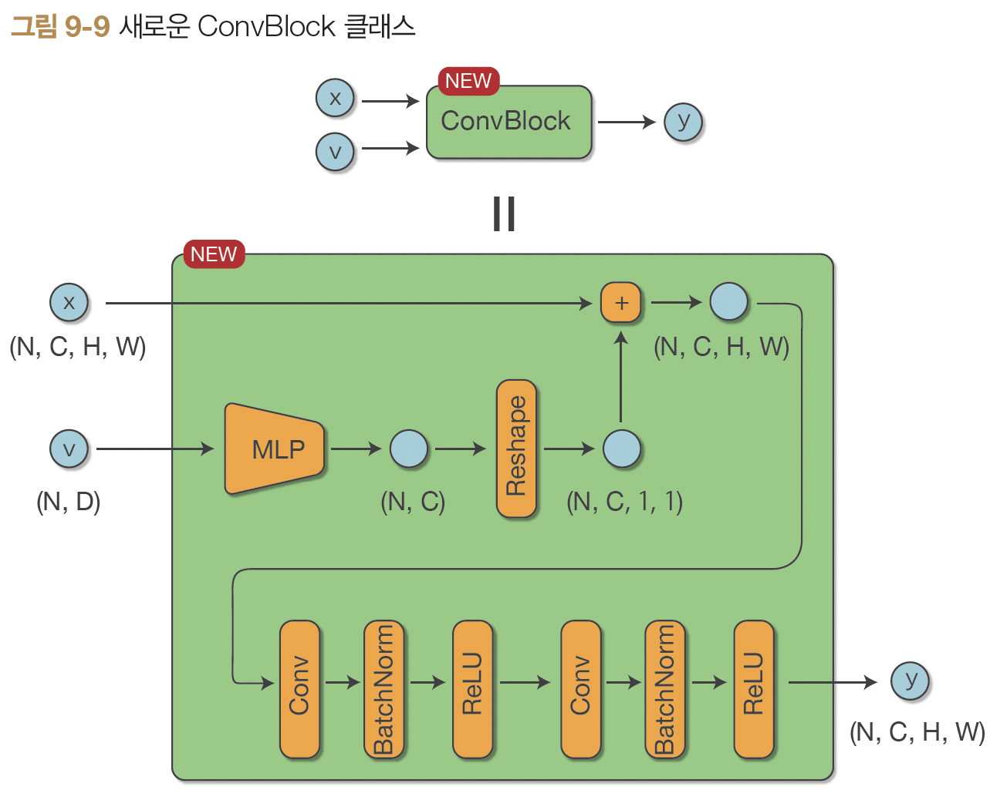

이번 절에서는 그림에 등장하는 다섯 ConvBlock에 사인파 위치 인코딩 정보를 추가합니다.

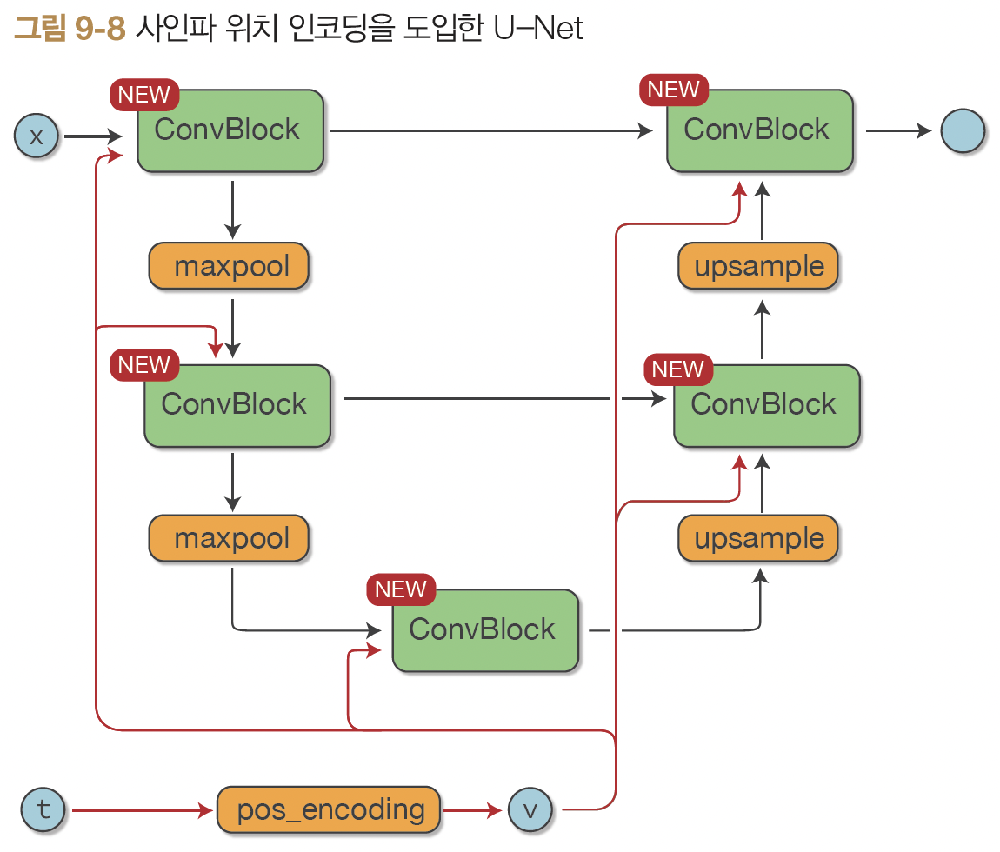

[그림 9-8]과 같이 NEW가 붙은 새로운 ConvBlock에는 사인파 위치 코딩 정보인 v도 입력합니다.

그리고 새로운 ConvBlock의 내부에서 [그림 9-9]의 처리를 수행합니다.


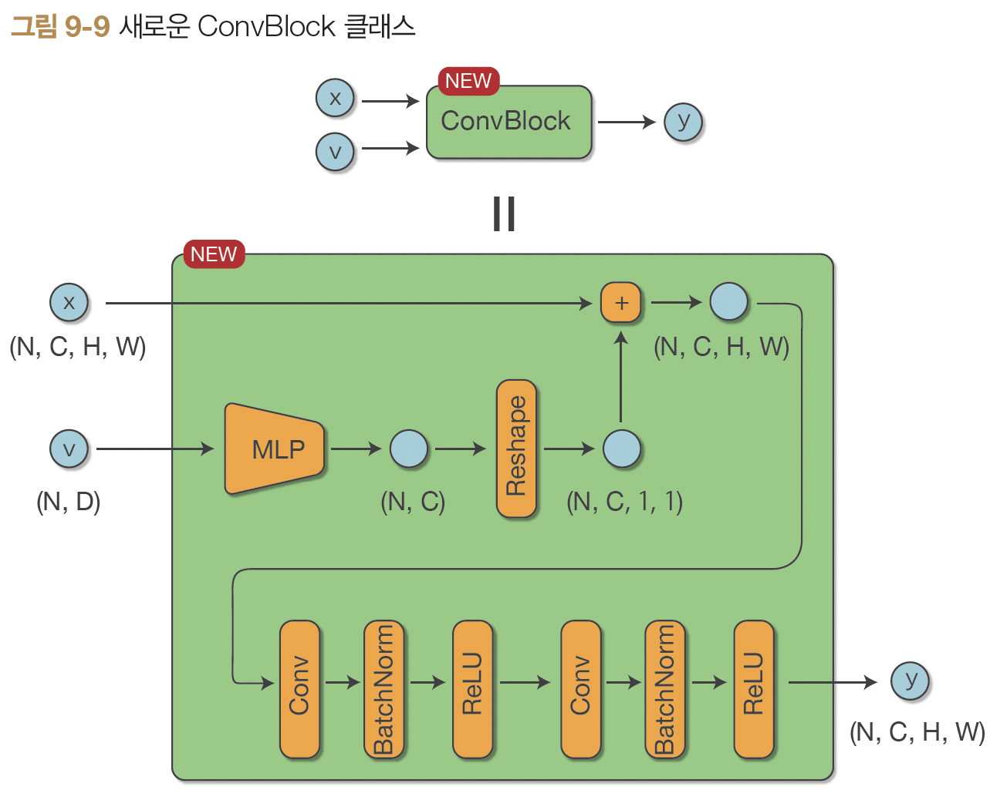

[그림 9-9]에서 x의 형상은 (N, C, H, W)이고 v의 형상은 (N, D)입니다.

v은 다층 퍼셉트론을 통과하면서 (N, C) 형상으로 변환된 후 다시 (N, C, 1, 1) 형성으로 바뀝니다.

이처럼 형상을 변환하는 이유는 이후 덧셈으로 브로드캐스팅 기능을 쓸 수 있도록 하기 위해서입니다. 다음은 새로운 ConvBlock 코드입니다



In [8]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_embed_dim):
        super().__init__()
        self.convs = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU()
        )
        self.mlp = nn.Sequential(
            nn.Linear(time_embed_dim, in_ch),
            nn.ReLU(),
            nn.Linear(in_ch, in_ch)
        )

    def forward(self, x, v):
        N, C, _, _ = x.shape
        v = self.mlp(v)
        v = v.view(N, C, 1, 1)
        y = self.convs(x + v)
        return y

In [9]:
class UNet(nn.Module):
    def __init__(self, in_ch=1, time_embed_dim=100):
        super().__init__()
        self.time_embed_dim = time_embed_dim

        self.down1 = ConvBlock(in_ch, 64, time_embed_dim)
        self.down2 = ConvBlock(64, 128, time_embed_dim)
        self.bot1 = ConvBlock(128, 256, time_embed_dim)
        self.up2 = ConvBlock(128 + 256, 128, time_embed_dim)
        self.up1 = ConvBlock(128 + 64, 64, time_embed_dim)
        self.out = nn.Conv2d(64, in_ch, 1)

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')

    def forward(self, x, timesteps):
        v = pos_encoding(timesteps, self.time_embed_dim, x.device)

        x1 = self.down1(x, v)
        x = self.maxpool(x1)
        x2 = self.down2(x, v)
        x = self.maxpool(x2)

        x = self.bot1(x, v)

        x = self.upsample(x)
        x = torch.cat([x, x2], dim=1)
        x = self.up2(x, v)
        x = self.upsample(x)
        x = torch.cat([x, x1], dim=1)
        x = self.up1(x, v)
        x = self.out(x)
        return x

##9.3 확산 과정

###9.3.1 $q(x_t | x_{t-1})$로부터 샘플링

$$q(x_t|x_{t-1}) = N(x_t ; \sqrt {1- \beta_t }x_{t-1},\beta_t I)$$

정규 분포로 부터의 샘플링은 재매개변수화 트릭을 사용하면 다음식으로 표현할 수 있다.

$$\; \; \;\varepsilon \sim \mathcal N(\varepsilon; 0, I)$$
$$x_t = \sqrt { ({1 - \beta_t})}x_{t-1} +  \sqrt \beta_t \varepsilon $$

In [10]:
import torch

x = torch.randn(3, 64, 64)
T = 1000
betas = torch.linspace(0.0001, 0.02, T)

for t in range(T):
    beta = betas[t]
    eps = torch.randn_like(x)
    x = torch.sqrt(1 - beta) * x + torch.sqrt(beta) * eps

###9.3.2 이미지 확산 과정

In [11]:
!wget https://raw.githubusercontent.com/oreilly-japan/deep-learning-from-scratch-5/main/step09/flower.png

--2025-04-26 11:30:45--  https://raw.githubusercontent.com/oreilly-japan/deep-learning-from-scratch-5/main/step09/flower.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8568 (8.4K) [image/png]
Saving to: ‘flower.png’

flower.png          100%[===================>]   8.37K  --.-KB/s    in 0s      

2025-04-26 11:30:46 (75.9 MB/s) - ‘flower.png’ saved [8568/8568]



In [12]:
import os
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

# load image
file_path = 'flower.png'
image = plt.imread(file_path)
print(image.shape)  # (64, 64, 3)

# preprocess
preprocess = transforms.ToTensor()
x = preprocess(image)
print(x.shape)  # (3, 64, 64)

(64, 64, 3)
torch.Size([3, 64, 64])


In [13]:
def reverse_to_img(x):
    x = x * 255
    x = x.clamp(0, 255)
    x = x.to(torch.uint8)
    to_pil = transforms.ToPILImage()
    return to_pil(x)

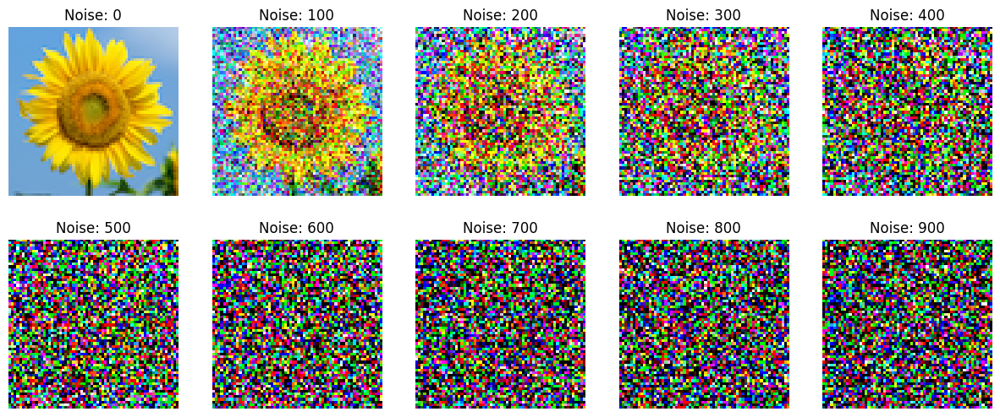

In [14]:
T = 1000
beta_start = 0.0001
beta_end = 0.02
betas = torch.linspace(beta_start, beta_end, T)
imgs = []

for t in range(T):
    if t % 100 == 0:
        img = reverse_to_img(x)
        imgs.append(img)

    beta = betas[t]
    eps = torch.randn_like(x)
    x = torch.sqrt(1 - beta) * x + torch.sqrt(beta) * eps

# show imgs
plt.figure(figsize=(15, 6))
for i, img in enumerate(imgs[:10]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f'Noise: {i * 100}')
    plt.axis('off')
plt.show()

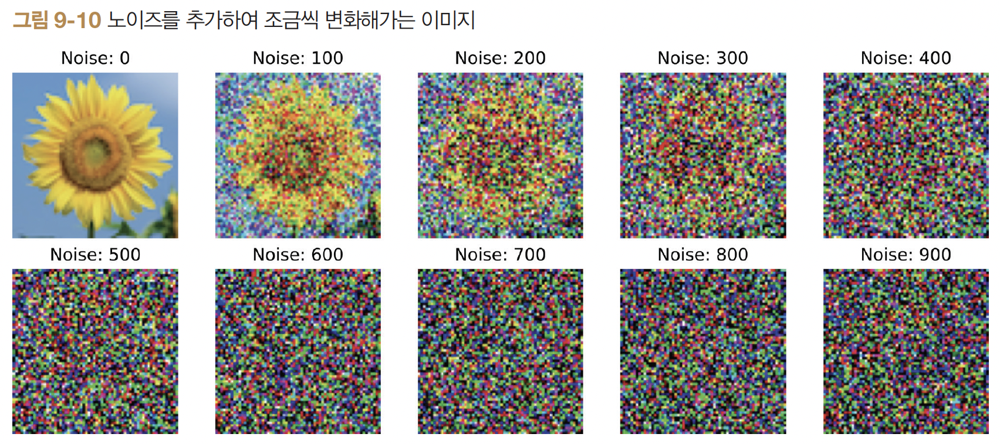

###9.3.3 $q(x_t | x_0)$로부터 샘플링

- 하이퍼파라미터 관계식

$$\begin{align}
 \alpha_t & = 1 - \beta_t \\
 \bar{\alpha}_t & =   \alpha_t \alpha_{t-1} \cdots \alpha_1  \\
\end{align}$$

- 확률분포 : $q(x_t | x_0)$

$$\begin{align}
q(x_t | x_0) & = N(x_t;\sqrt{\bar \alpha_t} {x}_0,(1 - \bar \alpha_t) I) \\
\end{align}$$

- $q(x_t | x_0)$으로부터 샘플링

$$\begin{align}
\varepsilon &\sim N(0, I) \\
x_t &= \sqrt {\bar \alpha_t}x_0 +  \sqrt {(1-\bar \alpha_t)}  \varepsilon
\end{align}$$




```
output = torch.cumprod(input, dim)
```



In [15]:
import torch

x = torch.tensor([1, 2, 3, 4])
output = torch.cumprod(x, dim=0)
print(output)

tensor([ 1,  2,  6, 24])


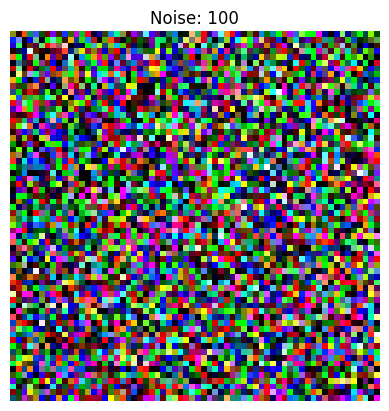

In [17]:
# 이미지 불러오기
file_path = 'flower.png'
image = plt.imread(file_path)
x = preprocess(img)
# print(image.shape)  # (64, 64, 3)

T = 1000
beta_start = 0.0001
beta_end = 0.02
betas = torch.linspace(beta_start, beta_end, T)

# ============================================
# q(x_t|x_0)
# ============================================
def add_noise(x_0, t, betas):
    T = len(betas)
    assert t >= 1 and t <= T
    t_idx = t - 1  # betas[0] is for t=1

    alphas = 1 - betas
    alpha_bars = torch.cumprod(alphas, dim=0)
    alpha_bar = alpha_bars[t_idx]

    # Change the data type of x_0 to float32
    x_0 = x_0.type(torch.float32)

    eps = torch.randn_like(x_0)
    x_t = torch.sqrt(alpha_bar) * x_0 + torch.sqrt(1 - alpha_bar) * eps
    return x_t


t = 100
x_t = add_noise(x, t, betas)

img = reverse_to_img(x_t)
plt.imshow(img)
plt.title(f'Noise: {t}')
plt.axis('off')
plt.show()

$$\begin{align}
\varepsilon &\sim \mathcal N(0, I) \\
x_t &= \sqrt {\bar \alpha_t}x_0 +  \sqrt {(1-\bar \alpha_t)}  \varepsilon
\end{align}$$


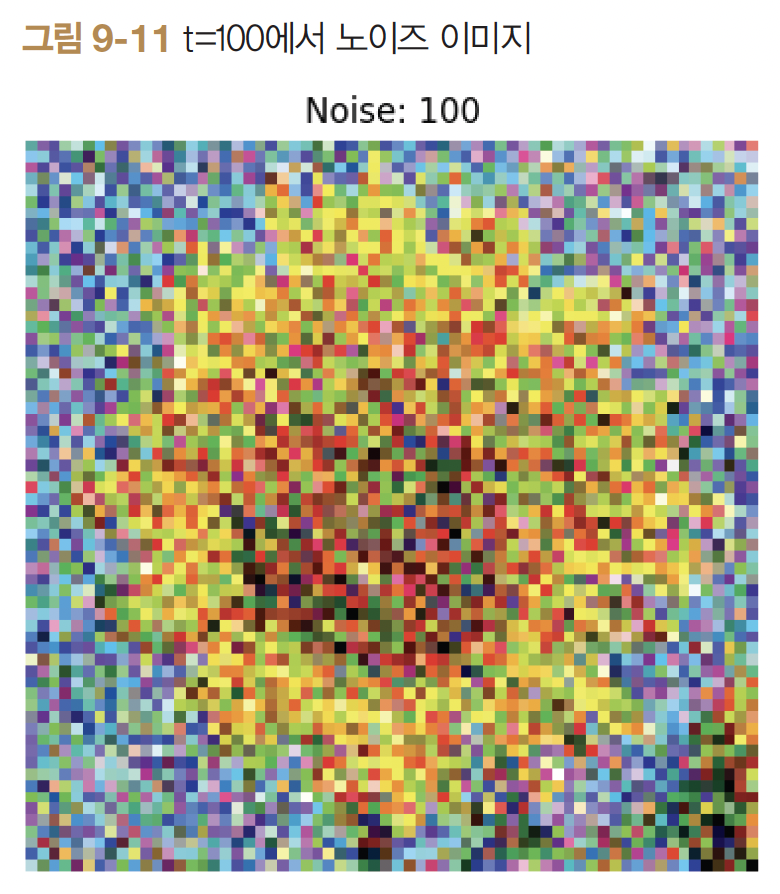

- gauusian_noise.py

(64, 64, 3)
torch.Size([3, 64, 64])


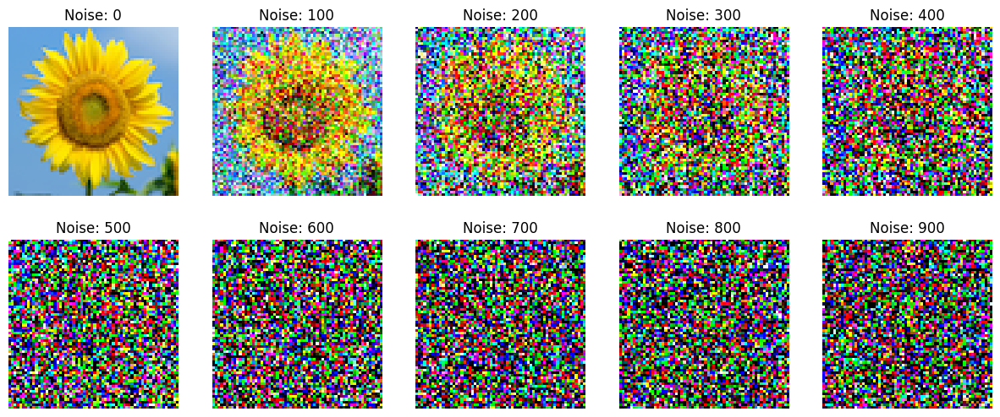

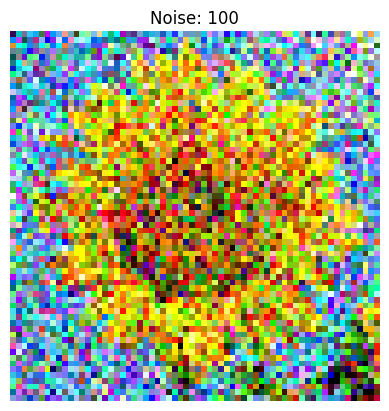

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms


x = torch.randn(3, 64, 64)
T = 1000
betas = torch.linspace(0.0001, 0.02, T)

for t in range(T):
    beta = betas[t]
    eps = torch.randn_like(x)
    x = torch.sqrt(1 - beta) * x + torch.sqrt(beta) * eps

# load image
file_path = 'flower.png'
image = plt.imread(file_path)
print(image.shape)  # (64, 64, 3)

# preprocess
preprocess = transforms.ToTensor()
x = preprocess(image)
print(x.shape)  # (3, 64, 64)

original_x = x.clone()  # keep original image

def reverse_to_img(x):
    x = x * 255
    x = x.clamp(0, 255)
    x = x.to(torch.uint8)
    to_pil = transforms.ToPILImage()
    return to_pil(x)

T = 1000
beta_start = 0.0001
beta_end = 0.02
betas = torch.linspace(beta_start, beta_end, T)
imgs = []

for t in range(T):
    if t % 100 == 0:
        img = reverse_to_img(x)
        imgs.append(img)

    beta = betas[t]
    eps = torch.randn_like(x)
    x = torch.sqrt(1 - beta) * x + torch.sqrt(beta) * eps

# show imgs
plt.figure(figsize=(15, 6))
for i, img in enumerate(imgs[:10]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f'Noise: {i * 100}')
    plt.axis('off')
plt.show()

# ============================================
# q(x_t|x_0)
# ============================================
def add_noise(x_0, t, betas):
    T = len(betas)
    assert t >= 1 and t <= T
    t_idx = t - 1  # betas[0] is for t=1

    alphas = 1 - betas
    alpha_bars = torch.cumprod(alphas, dim=0)
    alpha_bar = alpha_bars[t_idx]

    eps = torch.randn_like(x_0)
    x_t = torch.sqrt(alpha_bar) * x_0 + torch.sqrt(1 - alpha_bar) * eps
    return x_t

x = original_x

t = 100
x_t = add_noise(x, t, betas)

img = reverse_to_img(x_t)
plt.imshow(img)
plt.title(f'Noise: {t}')
plt.axis('off')
plt.show()

###9.3.4 Diffuser 클래스 구현

In [20]:
class Diffuser:
    def __init__(self, num_timesteps=1000, beta_start=0.0001, beta_end=0.02, device='cpu'):
        self.num_timesteps = num_timesteps
        self.device = device
        self.betas = torch.linspace(beta_start, beta_end, num_timesteps, device=device)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.cumprod(self.alphas, dim=0)

    def add_noise(self, x_0, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alpha_bars[0] is for t=1
        alpha_bar = self.alpha_bars[t_idx]  # (N,)
        N = alpha_bar.size(0)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)  # (N, 1, 1, 1)

        noise = torch.randn_like(x_0, device=self.device)
        x_t = torch.sqrt(alpha_bar) * x_0 + torch.sqrt(1 - alpha_bar) * noise
        return x_t, noise

##9.4 데이터 생성

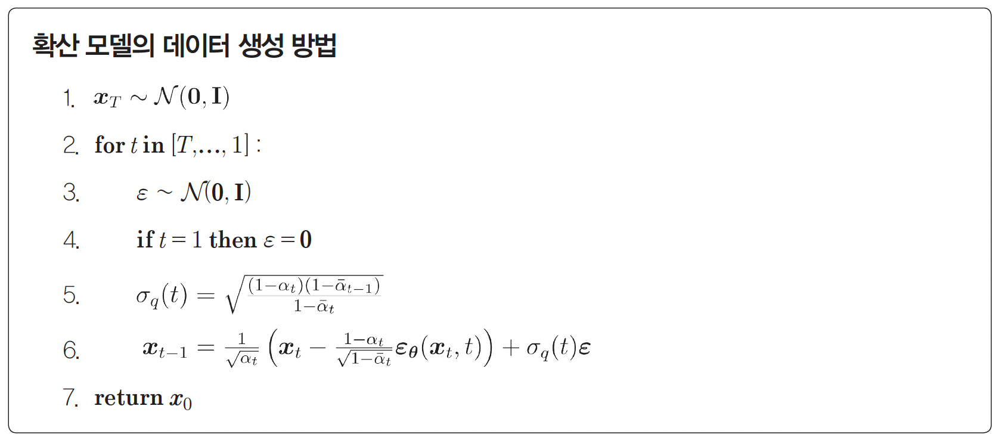

###9.4.1 노이즈 제거 처리

In [21]:
class Diffuser:
    # def __init__(self, num_times ...

    def denoise(self, model, x, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alphas[0] is for t=1
        alpha = self.alphas[t_idx]
        alpha_bar = self.alpha_bars[t_idx]
        alpha_bar_prev = self.alpha_bars[t_idx-1]

        N = alpha.size(0)
        alpha = alpha.view(N, 1, 1, 1)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)
        alpha_bar_prev = alpha_bar_prev.view(N, 1, 1, 1)

        model.eval()
        with torch.no_grad():
            eps = model(x, t)
        model.train()

        noise = torch.randn_like(x, device=self.device)
        noise[t == 1] = 0  # no noise at t=1

        mu = (x - ((1-alpha) / torch.sqrt(1-alpha_bar)) * eps) / torch.sqrt(alpha)
        std = torch.sqrt((1-alpha) * (1-alpha_bar_prev) / (1-alpha_bar))
        return mu + noise * std

###9.4.2 데이터 생성 구현

In [22]:
class Diffuser:
    def __init__(self, num_timesteps=1000, beta_start=0.0001, beta_end=0.02, device='cpu'):
        self.num_timesteps = num_timesteps
        self.device = device
        self.betas = torch.linspace(beta_start, beta_end, num_timesteps, device=device)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.cumprod(self.alphas, dim=0)

    def add_noise(self, x_0, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alpha_bars[0] is for t=1
        alpha_bar = self.alpha_bars[t_idx]  # (N,)
        N = alpha_bar.size(0)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)  # (N, 1, 1, 1)

        noise = torch.randn_like(x_0, device=self.device)
        x_t = torch.sqrt(alpha_bar) * x_0 + torch.sqrt(1 - alpha_bar) * noise
        return x_t, noise

    def denoise(self, model, x, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alphas[0] is for t=1
        alpha = self.alphas[t_idx]
        alpha_bar = self.alpha_bars[t_idx]
        alpha_bar_prev = self.alpha_bars[t_idx-1]

        N = alpha.size(0)
        alpha = alpha.view(N, 1, 1, 1)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)
        alpha_bar_prev = alpha_bar_prev.view(N, 1, 1, 1)

        model.eval()
        with torch.no_grad():
            eps = model(x, t)
        model.train()

        noise = torch.randn_like(x, device=self.device)
        noise[t == 1] = 0  # no noise at t=1

        mu = (x - ((1-alpha) / torch.sqrt(1-alpha_bar)) * eps) / torch.sqrt(alpha)
        std = torch.sqrt((1-alpha) * (1-alpha_bar_prev) / (1-alpha_bar))
        return mu + noise * std

    # --------------------

    def reverse_to_img(self, x):
        x = x * 255
        x = x.clamp(0, 255)
        x = x.to(torch.uint8)
        x = x.cpu()
        to_pil = transforms.ToPILImage()
        return to_pil(x)

    def sample(self, model, x_shape=(20, 1, 28, 28)):
        batch_size = x_shape[0]
        x = torch.randn(x_shape, device=self.device)

        for i in tqdm(range(self.num_timesteps, 0, -1)):
            t = torch.tensor([i] * batch_size, device=self.device, dtype=torch.long)
            x = self.denoise(model, x, t)

        images = [self.reverse_to_img(x[i]) for i in range(batch_size)]
        return images

##9.5 확산 모델의 학습(구현)

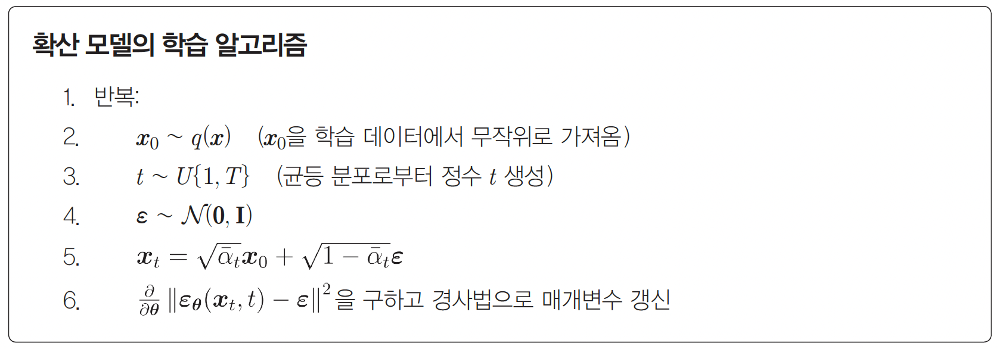

###9.5.1 확산 모델 학습 코드

In [23]:
import math
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.optim import Adam
import torch.nn.functional as F
from torch import nn
from tqdm import tqdm

img_size = 28
batch_size = 128
num_timesteps = 1000
epochs = 10
lr = 1e-3
device = 'cuda' if torch.cuda.is_available() else 'cpu'

def show_images(images, rows=2, cols=10):
    fig = plt.figure(figsize=(cols, rows))
    i = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, i + 1)
            plt.imshow(images[i], cmap='gray')
            plt.axis('off')
            i += 1
    plt.show()

In [24]:
preprocess = transforms.ToTensor()
dataset = torchvision.datasets.MNIST(root='./data', download=True, transform=preprocess)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

diffuser = Diffuser(num_timesteps, device=device)
model = UNet()
model.to(device)
optimizer = Adam(model.parameters(), lr=lr)

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.09MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 65.7kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.22MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.33MB/s]


100%|██████████| 469/469 [00:55<00:00,  8.50it/s]


Epoch 0 | Loss: 0.04820109749320092


100%|██████████| 469/469 [00:56<00:00,  8.31it/s]


Epoch 1 | Loss: 0.027750858421455315


100%|██████████| 469/469 [00:53<00:00,  8.85it/s]


Epoch 2 | Loss: 0.024118743938153615


100%|██████████| 469/469 [00:52<00:00,  8.96it/s]


Epoch 3 | Loss: 0.02230710012198829


100%|██████████| 469/469 [00:52<00:00,  8.88it/s]


Epoch 4 | Loss: 0.022010042435372437


100%|██████████| 469/469 [00:52<00:00,  8.87it/s]


Epoch 5 | Loss: 0.020889241583963065


100%|██████████| 469/469 [00:52<00:00,  8.89it/s]


Epoch 6 | Loss: 0.01992067554072022


100%|██████████| 469/469 [00:52<00:00,  8.92it/s]


Epoch 7 | Loss: 0.019098724683385287


100%|██████████| 469/469 [00:52<00:00,  8.92it/s]


Epoch 8 | Loss: 0.018812453993824498


100%|██████████| 469/469 [00:52<00:00,  8.89it/s]


Epoch 9 | Loss: 0.01944049670974583


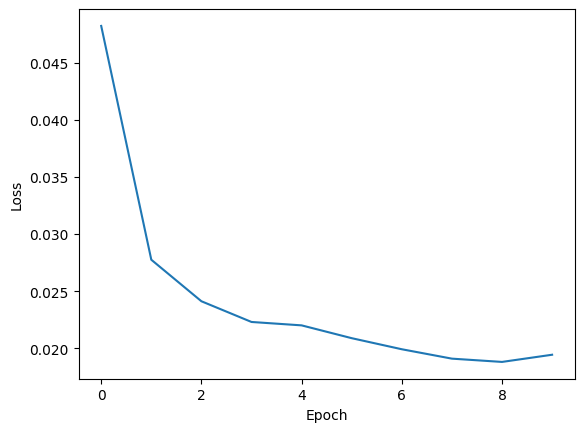

100%|██████████| 1000/1000 [00:09<00:00, 104.20it/s]


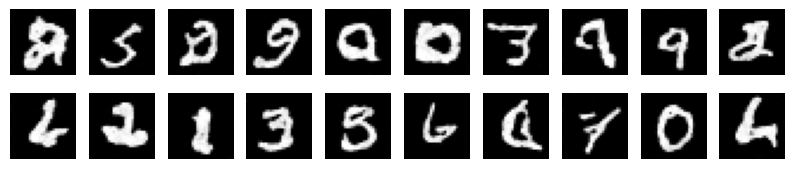

In [25]:
losses = []
for epoch in range(epochs):
    loss_sum = 0.0
    cnt = 0

    # generate samples every epoch ===================
    # images = diffuser.sample(model)
    # show_images(images)
    # ================================================

    for images, labels in tqdm(dataloader):
        optimizer.zero_grad()
        x = images.to(device)
        t = torch.randint(1, num_timesteps+1, (len(x),), device=device)

        x_noisy, noise = diffuser.add_noise(x, t)
        noise_pred = model(x_noisy, t)
        loss = F.mse_loss(noise, noise_pred)

        loss.backward()
        optimizer.step()

        loss_sum += loss.item()
        cnt += 1

    loss_avg = loss_sum / cnt
    losses.append(loss_avg)
    print(f'Epoch {epoch} | Loss: {loss_avg}')

# plot losses
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

# generate samples
images = diffuser.sample(model)
show_images(images)

###9.5.2 학습 결과

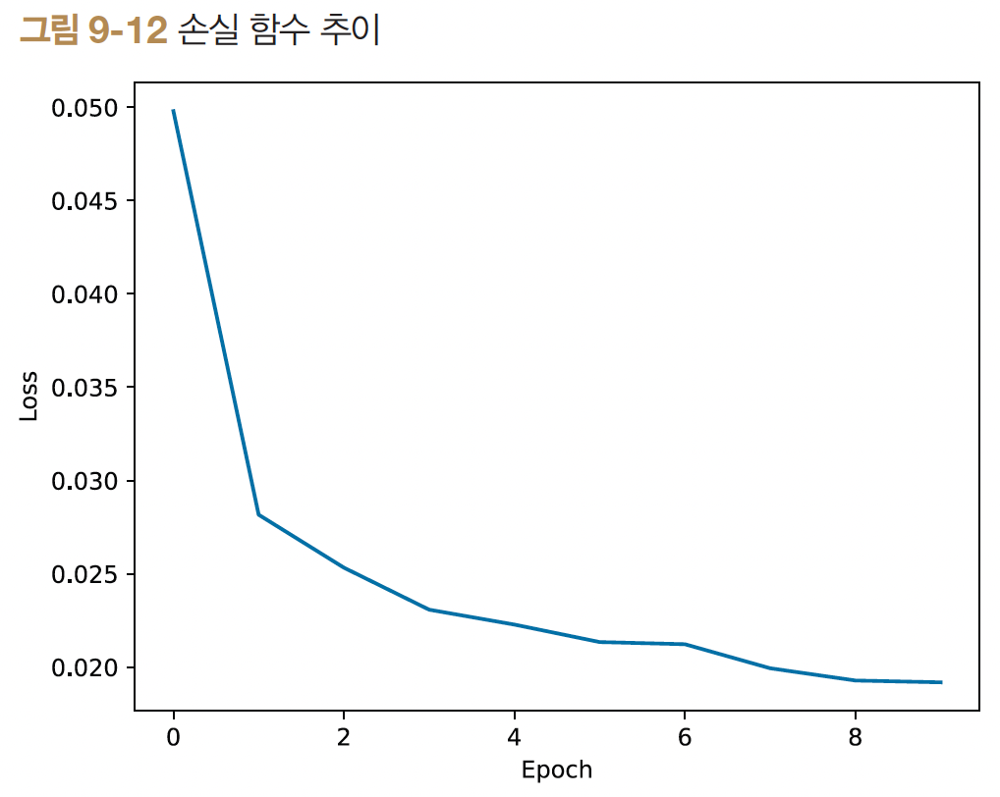

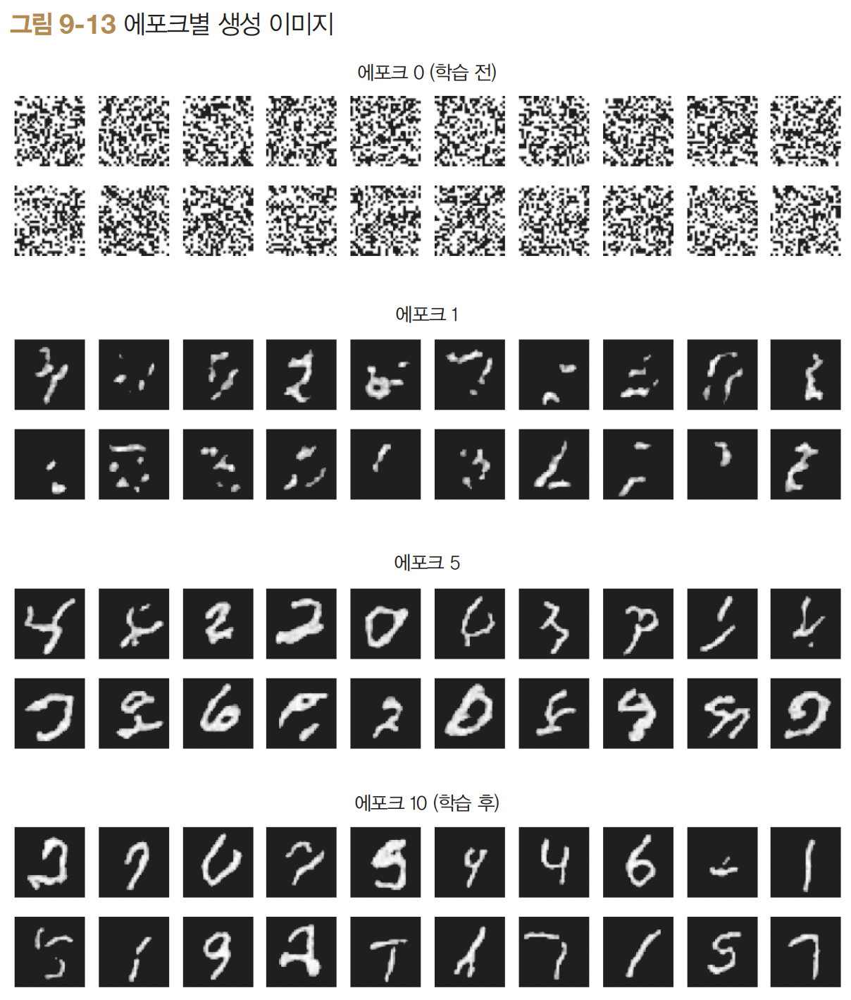

- diffusion_model.py

In [26]:
import math
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.optim import Adam
import torch.nn.functional as F
from torch import nn
from tqdm import tqdm


img_size = 28
batch_size = 128
num_timesteps = 1000
epochs = 10
lr = 1e-3
device = 'cuda' if torch.cuda.is_available() else 'cpu'


def show_images(images, rows=2, cols=10):
    fig = plt.figure(figsize=(cols, rows))
    i = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, i + 1)
            plt.imshow(images[i], cmap='gray')
            plt.axis('off')
            i += 1
    plt.show()

def _pos_encoding(time_idx, output_dim, device='cpu'):
    t, D = time_idx, output_dim
    v = torch.zeros(D, device=device)

    i = torch.arange(0, D, device=device)
    div_term = torch.exp(i / D * math.log(10000))

    v[0::2] = torch.sin(t / div_term[0::2])
    v[1::2] = torch.cos(t / div_term[1::2])
    return v

def pos_encoding(timesteps, output_dim, device='cpu'):
    batch_size = len(timesteps)
    device = timesteps.device
    v = torch.zeros(batch_size, output_dim, device=device)
    for i in range(batch_size):
        v[i] = _pos_encoding(timesteps[i], output_dim, device)
    return v

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_embed_dim):
        super().__init__()
        self.convs = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU()
        )
        self.mlp = nn.Sequential(
            nn.Linear(time_embed_dim, in_ch),
            nn.ReLU(),
            nn.Linear(in_ch, in_ch)
        )

    def forward(self, x, v):
        N, C, _, _ = x.shape
        v = self.mlp(v)
        v = v.view(N, C, 1, 1)
        y = self.convs(x + v)
        return y

class UNet(nn.Module):
    def __init__(self, in_ch=1, time_embed_dim=100):
        super().__init__()
        self.time_embed_dim = time_embed_dim

        self.down1 = ConvBlock(in_ch, 64, time_embed_dim)
        self.down2 = ConvBlock(64, 128, time_embed_dim)
        self.bot1 = ConvBlock(128, 256, time_embed_dim)
        self.up2 = ConvBlock(128 + 256, 128, time_embed_dim)
        self.up1 = ConvBlock(128 + 64, 64, time_embed_dim)
        self.out = nn.Conv2d(64, in_ch, 1)

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')

    def forward(self, x, timesteps):
        v = pos_encoding(timesteps, self.time_embed_dim, x.device)

        x1 = self.down1(x, v)
        x = self.maxpool(x1)
        x2 = self.down2(x, v)
        x = self.maxpool(x2)

        x = self.bot1(x, v)

        x = self.upsample(x)
        x = torch.cat([x, x2], dim=1)
        x = self.up2(x, v)
        x = self.upsample(x)
        x = torch.cat([x, x1], dim=1)
        x = self.up1(x, v)
        x = self.out(x)
        return x

class Diffuser:
    def __init__(self, num_timesteps=1000, beta_start=0.0001, beta_end=0.02, device='cpu'):
        self.num_timesteps = num_timesteps
        self.device = device
        self.betas = torch.linspace(beta_start, beta_end, num_timesteps, device=device)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.cumprod(self.alphas, dim=0)

    def add_noise(self, x_0, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alpha_bars[0] is for t=1
        alpha_bar = self.alpha_bars[t_idx]  # (N,)
        N = alpha_bar.size(0)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)  # (N, 1, 1, 1)

        noise = torch.randn_like(x_0, device=self.device)
        x_t = torch.sqrt(alpha_bar) * x_0 + torch.sqrt(1 - alpha_bar) * noise
        return x_t, noise

    def denoise(self, model, x, t):
        T = self.num_timesteps
        assert (t >= 1).all() and (t <= T).all()

        t_idx = t - 1  # alphas[0] is for t=1
        alpha = self.alphas[t_idx]
        alpha_bar = self.alpha_bars[t_idx]
        alpha_bar_prev = self.alpha_bars[t_idx-1]

        N = alpha.size(0)
        alpha = alpha.view(N, 1, 1, 1)
        alpha_bar = alpha_bar.view(N, 1, 1, 1)
        alpha_bar_prev = alpha_bar_prev.view(N, 1, 1, 1)

        model.eval()
        with torch.no_grad():
            eps = model(x, t)
        model.train()

        noise = torch.randn_like(x, device=self.device)
        noise[t == 1] = 0  # no noise at t=1

        mu = (x - ((1-alpha) / torch.sqrt(1-alpha_bar)) * eps) / torch.sqrt(alpha)
        std = torch.sqrt((1-alpha) * (1-alpha_bar_prev) / (1-alpha_bar))
        return mu + noise * std

    def reverse_to_img(self, x):
        x = x * 255
        x = x.clamp(0, 255)
        x = x.to(torch.uint8)
        x = x.cpu()
        to_pil = transforms.ToPILImage()
        return to_pil(x)

    def sample(self, model, x_shape=(20, 1, 28, 28)):
        batch_size = x_shape[0]
        x = torch.randn(x_shape, device=self.device)

        for i in tqdm(range(self.num_timesteps, 0, -1)):
            t = torch.tensor([i] * batch_size, device=self.device, dtype=torch.long)
            x = self.denoise(model, x, t)

        images = [self.reverse_to_img(x[i]) for i in range(batch_size)]
        return images


preprocess = transforms.ToTensor()
dataset = torchvision.datasets.MNIST(root='./data', download=True, transform=preprocess)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

diffuser = Diffuser(num_timesteps, device=device)
model = UNet()
model.to(device)
optimizer = Adam(model.parameters(), lr=lr)

losses = []
for epoch in range(epochs):
    loss_sum = 0.0
    cnt = 0

    # generate samples every epoch ===================
    # images = diffuser.sample(model)
    # show_images(images)
    # ================================================

    for images, labels in tqdm(dataloader):
        optimizer.zero_grad()
        x = images.to(device)
        t = torch.randint(1, num_timesteps+1, (len(x),), device=device)

        x_noisy, noise = diffuser.add_noise(x, t)
        noise_pred = model(x_noisy, t)
        loss = F.mse_loss(noise, noise_pred)

        loss.backward()
        optimizer.step()

        loss_sum += loss.item()
        cnt += 1

    loss_avg = loss_sum / cnt
    losses.append(loss_avg)
    print(f'Epoch {epoch} | Loss: {loss_avg}')

# plot losses
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

# generate samples
images = diffuser.sample(model)
show_images(images)

 12%|█▏        | 54/469 [00:06<00:48,  8.56it/s]


KeyboardInterrupt: 